<a href="https://www.kaggle.com/code/szymnq/si-final?scriptVersionId=180309930" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np 
import pandas as pd 
import os
import graphviz
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.colors import ListedColormap

from ydata_profiling import ProfileReport

from scipy.cluster.hierarchy import dendrogram, linkage

from mlxtend.plotting import plot_decision_regions

from pylab import rcParams

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn.metrics import accuracy_score, precision_score, recall_score, silhouette_score, classification_report

In [2]:
import warnings
warnings.filterwarnings("ignore", "use_inf_as_na")
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/pima-indians-diabetes-database/diabetes.csv
/kaggle/input/mushroom-classification/mushrooms.csv


# Load data

## Mushrooms

In [4]:
data_mushrooms = pd.read_csv('../input/mushroom-classification/mushrooms.csv')
print(data_mushrooms.shape)
data_mushrooms.head()

(8124, 23)


,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g


In [5]:
data_mushrooms['class'].value_counts()

class
e    4208
p    3916
Name: count, dtype: int64

## Indians

In [6]:
data_indians = pd.read_csv('../input/pima-indians-diabetes-database/diabetes.csv')
print(data_indians.shape)
data_indians.head()

(768, 9)


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [7]:
data_indians['Outcome'].value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

# Data exploring

## Mushrooms

In [8]:
ProfileReport(data_mushrooms, title="Mushrooms Profiling Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Indians

In [9]:
ProfileReport(data_indians, title="Indians Profiling Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Clustering

In [10]:
def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1 
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

## indians

In [11]:
data_indians.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [12]:
X_data_indians = data_indians.iloc[:, :-1]
X_data_indians.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33


In [13]:
scaler = StandardScaler()

scaled_X_data_indians = scaler.fit_transform(X_data_indians)
scaled_X_data_indians[:5]

array([[ 0.63994726,  0.84832379,  0.14964075,  0.90726993, -0.69289057,
         0.20401277,  0.46849198,  1.4259954 ],
       [-0.84488505, -1.12339636, -0.16054575,  0.53090156, -0.69289057,
        -0.68442195, -0.36506078, -0.19067191],
       [ 1.23388019,  1.94372388, -0.26394125, -1.28821221, -0.69289057,
        -1.10325546,  0.60439732, -0.10558415],
       [-0.84488505, -0.99820778, -0.16054575,  0.15453319,  0.12330164,
        -0.49404308, -0.92076261, -1.04154944],
       [-1.14185152,  0.5040552 , -1.50468724,  0.90726993,  0.76583594,
         1.4097456 ,  5.4849091 , -0.0204964 ]])

Agglomerative

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html

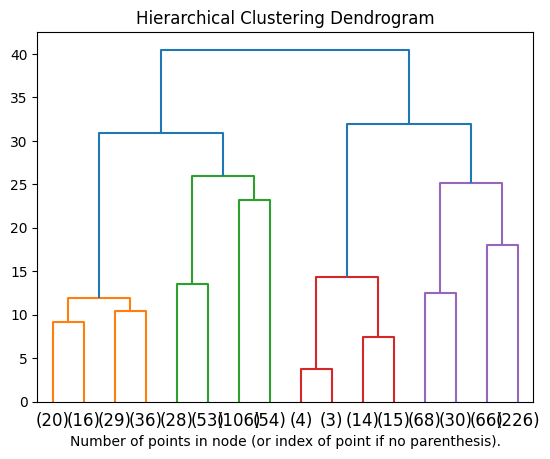

In [14]:
clustering = AgglomerativeClustering(distance_threshold=0, n_clusters=None)


clustering = clustering.fit(scaled_X_data_indians)
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(clustering, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

K-means

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

In [15]:
X_data_indians.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

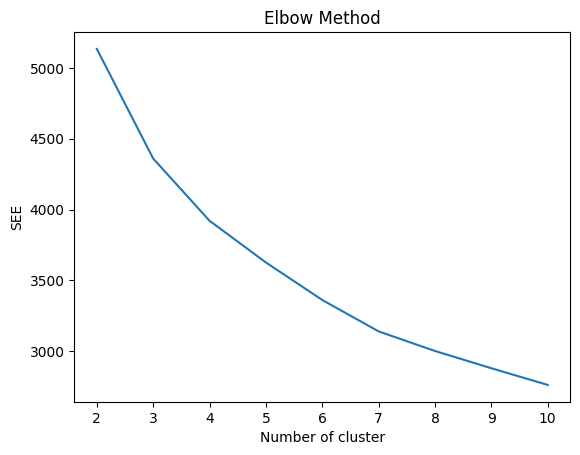

In [16]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "random_state": 42,
}

see = {}
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs).fit(scaled_X_data_indians)
    X_data_indians["clusters"] = kmeans.labels_
    see[k] = kmeans.inertia_
    
    sil_coeff = silhouette_score(scaled_X_data_indians, kmeans.fit_predict(scaled_X_data_indians))
  
plt.figure()
plt.plot(list(see.keys()), list(see.values()))
plt.title("Elbow Method")
plt.xlabel("Number of cluster")
plt.ylabel("SEE")
plt.show()

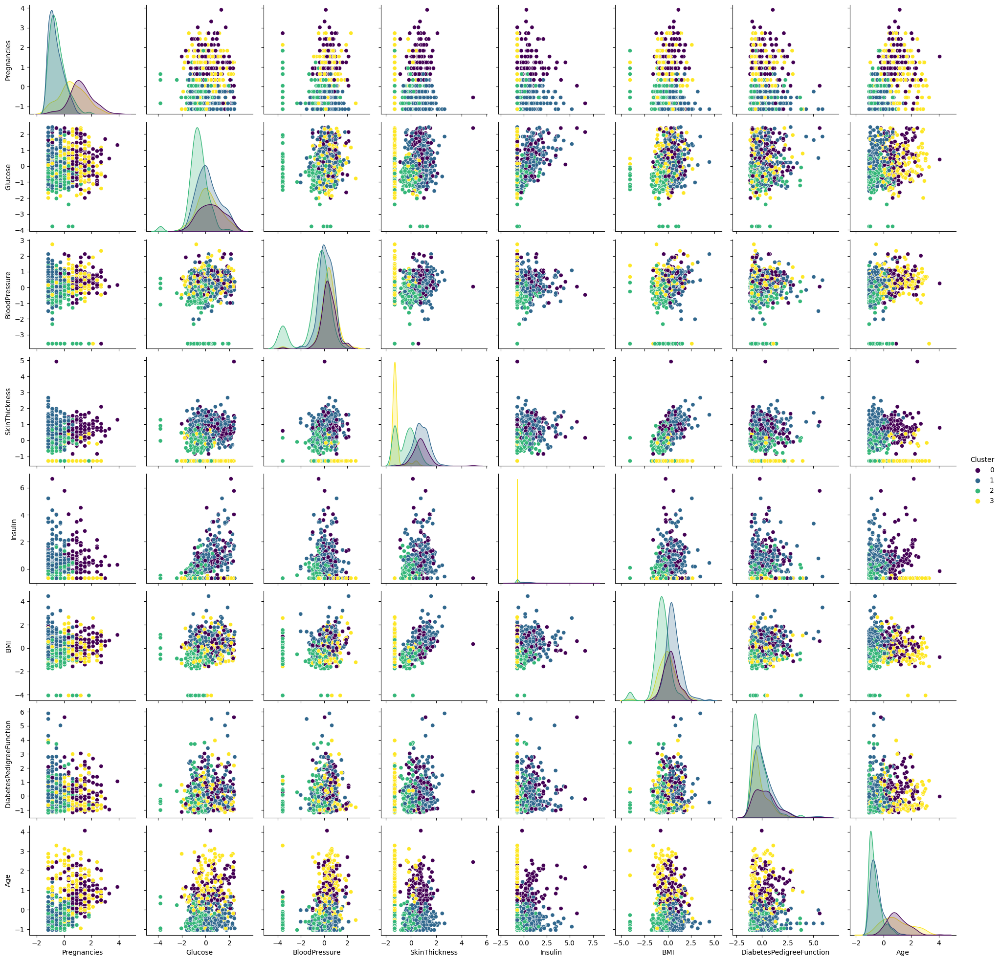

In [17]:
clustering = KMeans(n_clusters=4, max_iter=1000, n_init="auto")

clustering_predict = clustering.fit_predict(scaled_X_data_indians)

clustering_df = pd.DataFrame(scaled_X_data_indians, columns=X_data_indians.columns[:-1])
clustering_df['Cluster'] = clustering_predict

sns.pairplot(clustering_df, hue='Cluster', palette='viridis')
plt.show()

# Classification

In [18]:
def classify_and_plot(X, y, n_neighbors):
    ''' 
    split data, fit, classify, plot and evaluate results 
    '''
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 41)
    h = .02 
    
    cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
    cmap_bold  = ListedColormap(['#FF0000', '#0000FF'])

    rcParams['figure.figsize'] = 5, 5
    for weights in ['uniform', 'distance']:
        clf = KNeighborsClassifier(n_neighbors, weights=weights)
        clf.fit(X_train, y_train)

        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

        Z = Z.reshape(xx.shape)
        fig = plt.figure()
        plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

        plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, edgecolor='k', s=20)   
        plt.xlim(xx.min(), xx.max())
        plt.ylim(yy.min(), yy.max())
        plt.title("0/1 outcome classification (k = %i, weights = '%s')" % (n_neighbors, weights))
        plt.show()

## Mushrooms

In [19]:
print(data_mushrooms.shape)
data_mushrooms.head()

(8124, 23)


,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g


In [20]:
X_data_mushrooms = data_mushrooms.iloc[:, 1:]
X_data_mushrooms = X_data_mushrooms.drop("veil-type", axis=1)

In [21]:
if not X_data_mushrooms.select_dtypes(exclude=['number']).columns.empty:
    cols = X_data_mushrooms.select_dtypes(exclude=['number']).columns
    print("Non numeric columns:", cols)
    for col_name in cols:
        encoder = OneHotEncoder(sparse_output=False)
        encoded_data = encoder.fit_transform(X_data_mushrooms[[col_name]])
        encoded_columns = [f"{col_name}_{cat}" for cat in encoder.categories_[0]]
        encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns)
        X_data_mushrooms = X_data_mushrooms.drop([col_name], axis=1)
        X_data_mushrooms = pd.concat([X_data_mushrooms, encoded_df], axis=1)
else:
    print("All columns are numeric")

Non numeric columns: Index(['cap-shape', 'cap-surface', 'cap-color', 'bruises', 'odor',
       'gill-attachment', 'gill-spacing', 'gill-size', 'gill-color',
       'stalk-shape', 'stalk-root', 'stalk-surface-above-ring',
       'stalk-surface-below-ring', 'stalk-color-above-ring',
       'stalk-color-below-ring', 'veil-color', 'ring-number', 'ring-type',
       'spore-print-color', 'population', 'habitat'],
      dtype='object')


In [22]:
X_data_mushrooms.head()

,cap-shape_b,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_f,cap-surface_g,cap-surface_s,cap-surface_y,...,population_s,population_v,population_y,habitat_d,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [23]:
y_data_mushrooms = data_mushrooms.iloc[:, 0]
y_data_mushrooms = y_data_mushrooms.map({'e': 0, 'p': 1})
y_data_mushrooms.head()

0    1
1    0
2    0
3    1
4    0
Name: class, dtype: int64

In [24]:
print(X_data_mushrooms.shape)
print(y_data_mushrooms.shape)

(8124, 116)
(8124,)


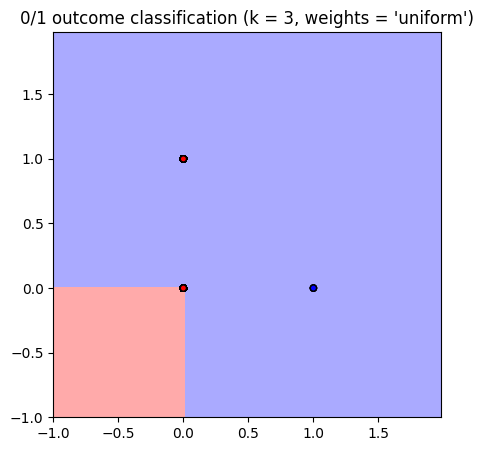

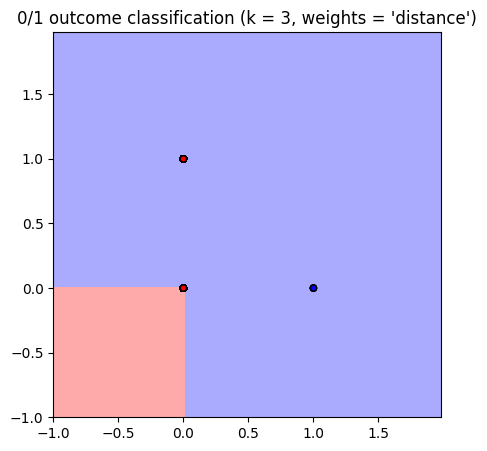

In [25]:
# X = np.array(X_data_mushrooms.iloc[:rows_nbr, :])
X = np.array(X_data_mushrooms.iloc[:, [1,2]])
y = np.array(y_data_mushrooms.iloc[:])

classify_and_plot(X, y, 3)

In [27]:
# X_prime = np.array(X_data_mushrooms.iloc[:, [15, 33]])
# X = X_data_mushrooms
# y = np.array(y_data_mushrooms)

# classify_and_plot(X, y, 3)

In [26]:
X_data_mushrooms.head()

,cap-shape_b,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_f,cap-surface_g,cap-surface_s,cap-surface_y,...,population_s,population_v,population_y,habitat_d,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [27]:
y_data_mushrooms

0       1
1       0
2       0
3       1
4       0
       ..
8119    0
8120    0
8121    0
8122    1
8123    0
Name: class, Length: 8124, dtype: int64

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X_data_mushrooms, y_data_mushrooms, test_size=0.4, random_state=42)

### KNN

In [29]:
knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=4)

In [30]:
y_pred = knn.predict(X_test)

In [31]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 1.0
Precision: 1.0
Recall: 1.0


### Random Forest

In [32]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [33]:
y_pred = rf.predict(X_test)

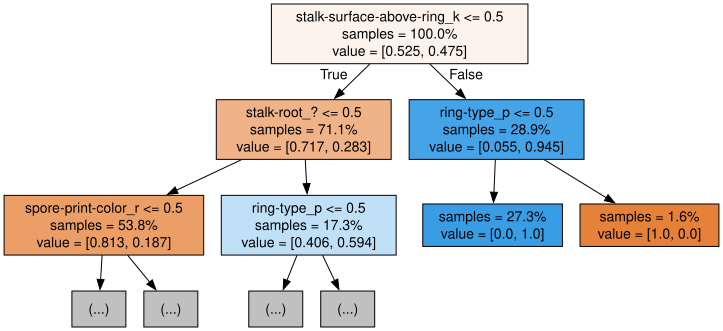

In [34]:
tree = rf.estimators_[0]
dot_data = export_graphviz(tree,
                           feature_names=X_train.columns,  
                           filled=True,  
                           max_depth=2, 
                           impurity=False, 
                           proportion=True)
graph = graphviz.Source(dot_data)
display(graph)

In [37]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.9932492349
Precision: 0.92123129
Recall: 0.9575765675


## Indians

In [38]:
scaled_X_data_indians[:5]

array([[ 0.63994726,  0.84832379,  0.14964075,  0.90726993, -0.69289057,
         0.20401277,  0.46849198,  1.4259954 ],
       [-0.84488505, -1.12339636, -0.16054575,  0.53090156, -0.69289057,
        -0.68442195, -0.36506078, -0.19067191],
       [ 1.23388019,  1.94372388, -0.26394125, -1.28821221, -0.69289057,
        -1.10325546,  0.60439732, -0.10558415],
       [-0.84488505, -0.99820778, -0.16054575,  0.15453319,  0.12330164,
        -0.49404308, -0.92076261, -1.04154944],
       [-1.14185152,  0.5040552 , -1.50468724,  0.90726993,  0.76583594,
         1.4097456 ,  5.4849091 , -0.0204964 ]])

In [39]:
X_data_indians.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,clusters
0,6,148,72,35,0,33.6,0.627,50,3
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,7
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,9


In [40]:
y_data_indians = data_indians.iloc[:, -1]
y_data_indians.head()

0    1
1    0
2    1
3    0
4    1
Name: Outcome, dtype: int64

### KNN

In [41]:
X_data_indians.iloc[:, 1]

0      148
1       85
2      183
3       89
4      137
      ... 
763    101
764    122
765    121
766    126
767     93
Name: Glucose, Length: 768, dtype: int64

In [42]:
knn_cv = KNeighborsClassifier(n_neighbors=3)
cv_scores = cross_val_score(knn_cv, scaled_X_data_indians, y_data_indians, cv=20)
print(cv_scores)
print("cv_scores mean:{}".format(np.mean(cv_scores)))

[0.58974359 0.74358974 0.74358974 0.79487179 0.74358974 0.69230769
 0.69230769 0.74358974 0.76315789 0.81578947 0.76315789 0.68421053
 0.73684211 0.84210526 0.78947368 0.89473684 0.68421053 0.68421053
 0.65789474 0.86842105]
cv_scores mean:0.7463900134952766


In [43]:
knn2 = KNeighborsClassifier()
param_grid = {'n_neighbors': np.arange(1, 25)}
knn_gscv = GridSearchCV(knn2, param_grid, cv=20)
knn_gscv.fit(scaled_X_data_indians, y_data_indians)

GridSearchCV(cv=20, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])})

In [44]:
knn_gscv.best_params_

{'n_neighbors': 23}

In [45]:
knn_gscv.best_score_

0.7619770580296896

In [46]:
data_indians.iloc[:, :-1].head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33


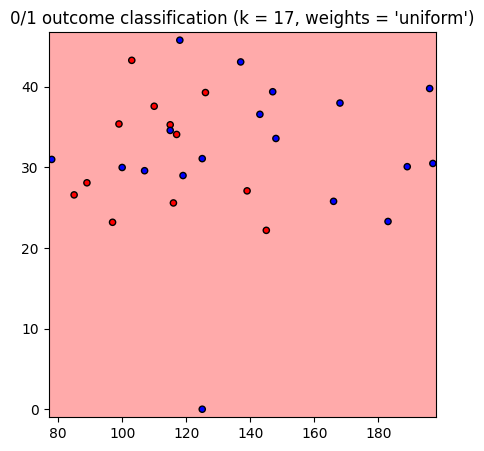

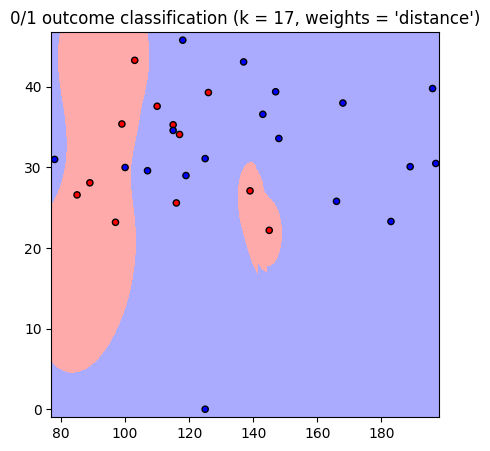

In [47]:
rows_nbr = 30
X_prime = np.array(data_indians.iloc[:rows_nbr, [1,5]])
X = X_prime
y = np.array(data_indians.iloc[:rows_nbr, 8])

classify_and_plot(X, y, 17)

### Random Forest

In [48]:
rf_cv = RandomForestClassifier()
rf_cv.fit(X_train, y_train)

cv_scores = cross_val_score(rf_cv, data_indians, y_data_indians, cv=20)
print(cv_scores)
print("cv_scores mean:{}".format(np.mean(cv_scores)))

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
cv_scores mean:1.0


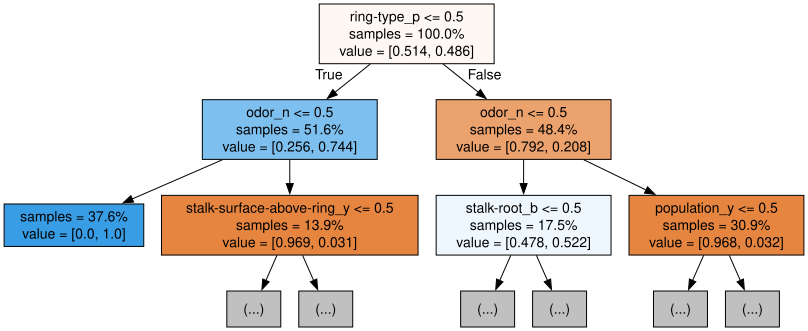

In [49]:
tree = rf_cv.estimators_[0]
dot_data = export_graphviz(tree,
                           feature_names=X_train.columns,  
                           filled=True,  
                           max_depth=2, 
                           impurity=False, 
                           proportion=True)
graph = graphviz.Source(dot_data)
display(graph)

In [50]:
rf2 = RandomForestClassifier()
param_grid = { 
    'n_estimators': [200, 500],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}
rf_gscv = GridSearchCV(rf2, param_grid, cv=20)

rf_gscv.fit(scaled_X_data_indians, y_data_indians)

GridSearchCV(cv=20, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'n_estimators': [200, 500]})

In [51]:
rf_gscv.best_params_

{'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 500}

In [52]:
rf_gscv.best_score_

0.7726045883940621